## Introduction: Why Julia?

<p align="center">
    <img src="https://github.com/JuliaLang/julia-logo-graphics/blob/master/images/julia-logo-color.png?raw=true" alt="Julia Logo">
</p>




- **High performance**: Julia is just-in-time compiled, allowing it to achieve performance comparable to statically-typed languages like C.
- **Ease of use**: Julia's syntax is expressive and easy for those familiar with other programming languages like Python or MATLAB.
- **Open-source**: Anyone can contribute to its development.
- **Seamless integration with other languages**: It can easily call C, Fortran, and Python functions.



## High Performance 

- One of the most touted features of Julia is its performance. 
- The language is designed with performance in mind from the ground up. 
- Its just-in-time (JIT) compilation with LLVM means that it can often match or even exceed the speed of languages like C or Fortran for many computational tasks. 
- This is especially valuable for tasks like numerical simulation, data analysis, and optimization where performance is crucial.

In [1]:
import Pkg
Pkg.add("Colors")
Pkg.add("Images")

   Resolving package versions...


  No Changes to `~/.julia/environments/v1.9/Project.toml`
  No Changes to `~/.julia/environments/v1.9/Manifest.toml`


   Resolving package versions...


  No Changes to `~/.julia/environments/v1.9/Project.toml`
  No Changes to `~/.julia/environments/v1.9/Manifest.toml`


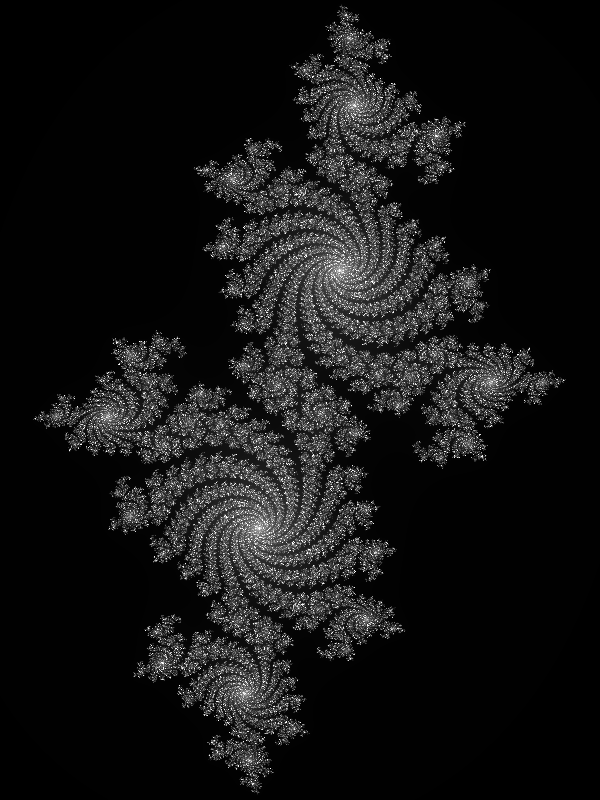

In [2]:
using Colors, Images

# Define the Julia function
function julia(c, maxiter)
    function func(z)
        for n = 1:maxiter
            if abs2(z) > 4
                return n-1
            end
            z = z*z + c
        end
        return maxiter
    end
    return func
end

# Generate the Julia set image
function generate_julia_image(width, height, c, maxiter=1000)
    julia_func = julia(c, maxiter)
    img = zeros(Float64, width, height)
    
    for x = 1:width
        for y = 1:height
            zx = 3 * (x - width / 2) / width
            zy = 2 * (y - height / 2) / height
            img[x, y] = julia_func(complex(zx, zy)) / maxiter
        end
    end
    
    # Convert to grayscale image
    img = Gray.(img)
    return img
end

# Parameters for the Julia set
c = complex(-0.7, 0.27015)
width, height = 800, 600

# Generate and display the image
img = generate_julia_image(width, height, c)
img


┌ Info: Saved animation to /var/folders/pl/9s2ysv_92pn6_2w7j2t40mh00000gn/T/jl_reHERiLity.gif
└ @ Plots /Users/cls/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/var/folders/pl/9s2ysv_92pn6_2w7j2t40mh00000gn/T/jl_reHERiLity.gif")
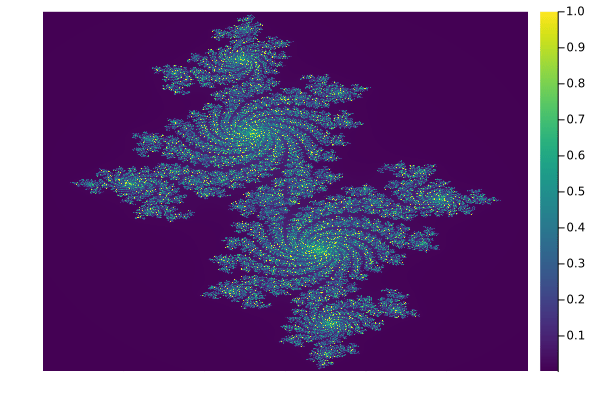

In [5]:
using Plots
using Colors

function julia(c, maxiter)
    function func(z)
        for n = 1:maxiter
            if abs2(z) > 4
                return n-1
            end
            z = z*z + c
        end
        return maxiter
    end
    return func
end

function generate_julia_image(width, height, c, xlims, ylims, maxiter=1000)
    julia_func = julia(c, maxiter)
    img = zeros(Float64, width, height)
    
    xspan = xlims[2] - xlims[1]
    yspan = ylims[2] - ylims[1]
    
    for x = 1:width
        for y = 1:height
            zx = xlims[1] + xspan * (x / width)
            zy = ylims[1] + yspan * (y / height)
            img[x, y] = julia_func(complex(zx, zy)) / maxiter
        end
    end
    
    return img
end

function julia_zoom_animation(width, height, c, center, maxiter=1000, zoom_factor=0.98, nframes=100)
    xlims = [-1.5, 1.5]
    ylims = [-1.0, 1.0]
    
    anim = @animate for _ = 1:nframes
        img = generate_julia_image(width, height, c, xlims, ylims, maxiter)
        heatmap(img, color=:viridis, axis=false)
        
        xspan = xlims[2] - xlims[1]
        yspan = ylims[2] - ylims[1]
        xlims = [center[1] - xspan*zoom_factor/2, center[1] + xspan*zoom_factor/2]
        ylims = [center[2] - yspan*zoom_factor/2, center[2] + yspan*zoom_factor/2]
    end
    return anim
end

# Parameters for the animation
width, height = 800, 600
c = complex(-0.7, 0.27015)
center = [0.0, 0.0]

# Generate and display the animation
anim = julia_zoom_animation(width, height, c, center)
gif(anim, fps=10)


## Ease of Use

- Julia's syntax is expressive and familiar to users of other technical computing environments, making it relatively easy to pick up, especially for those with experience in MATLAB or Python. 
- The language aims to be as user-friendly as Python while maintaining the speed of C, bridging the gap between "high-level" and "low-level" languages.

In [10]:
function fibonacci(n)
    if n <= 0
        return Int[]
    elseif n == 1
        return [0]
    elseif n == 2
        return [0, 1]
    else
        fib_seq = [0, 1]
        for i = 3:n
            push!(fib_seq, fib_seq[end] + fib_seq[end-1])
        end
        return fib_seq
    end
end

println(fibonacci(10))


[0, 1, 1, 2, 3, 5, 8, 13, 21, 34]


**Python**

```python
def fibonacci(n):
    if n <= 0:
        return []
    elif n == 1:
        return [0]
    elif n == 2:
        return [0, 1]
    else:
        fib_seq = [0, 1]
        for i in range(2, n):
            fib_seq.append(fib_seq[-1] + fib_seq[-2])
        return fib_seq

print(fibonacci(10))
``````

**MATLAB**

```matlab
function fib_seq = fibonacci(n)
    if n <= 0
        fib_seq = [];
    elseif n == 1
        fib_seq = 0;
    elseif n == 2
        fib_seq = [0, 1];
    else
        fib_seq = [0, 1];
        for i = 3:n
            fib_seq(i) = fib_seq(i-1) + fib_seq(i-2);
        end
    end
end

disp(fibonacci(10))

```

**C++**

```cpp
#include <iostream>
#include <vector>

std::vector<int> fibonacci(int n) {
    std::vector<int> fib_seq;

    if (n <= 0) {
        return fib_seq;
    } else if (n == 1) {
        fib_seq.push_back(0);
    } else if (n == 2) {
        fib_seq.push_back(0);
        fib_seq.push_back(1);
    } else {
        fib_seq.push_back(0);
        fib_seq.push_back(1);
        for (int i = 3; i <= n; i++) {
            fib_seq.push_back(fib_seq[i-2] + fib_seq[i-3]);
        }
    }
    return fib_seq;
}

int main() {
    std::vector<int> result = fibonacci(10);
    for (int val : result) {
        std::cout << val << " ";
    }
    std::cout << std::endl;
    return 0;
}

```

## Seamless Integration with Other Languages

In [13]:
Pkg.add("PyCall")

   Resolving package versions...


   Installed PyCall ─ v1.96.1


    Updating `~/.julia/environments/v1.9/Project.toml`
  [438e738f] + PyCall v1.96.1
    Updating `~/.julia/environments/v1.9/Manifest.toml`
 

 [438e738f] + PyCall v1.96.1
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/43d304ac6f0354755f1d60730ece8c499980f7ba/build.log`


Precompiling project...


  ✓ PyCall
  1 dependency successfully precompiled in 8 seconds. 221 already precompiled. 2 skipped during auto due to previous errors.


In [2]:
using PyCall

numpy = pyimport("numpy")
result = numpy.sin(1)
println(result)


0.8414709848078965
